In [125]:
import os
import numpy as np
from scipy.constants import c
from matplotlib import pyplot as plt

# Read data
data_root = os.path.join('/Users/mtang/Library/CloudStorage/Box-Box/Vayyar Radar/0212')
# cur_case = 'rear_back_left_3m_1.8+0.7m'
# 2.5m
# cur_scenario = '50k_profile_1_distance2.5_gt_40_round_1'
cur_case = 'rear_back_left_5m_1.8+0.7m'
cur_scenario = '50k_profile_1_distance2.5_gt_30_round_1'

num_tx = 10
rbw = 50

data_path = os.path.join(data_root, cur_case, cur_scenario)
recording = np.load(os.path.join(data_path, "recording.npy"))
# calibration = np.load(os.path.join(data_path, "calibration.npy"))
# calibration = recording[0, :, :]
config = np.load(os.path.join(data_path, "config.npy"), allow_pickle=True).item()
doppler_nfft = recording.shape[0]
range_nfft = 512
angle_nfft = [6, 6]
data = recording

FileNotFoundError: [Errno 2] No such file or directory: '/Users/mtang/Library/CloudStorage/Box-Box/Vayyar Radar/0212/rear_back_left_5m_1.8+0.7m/50k_profile_1_distance1.8_gt_40_round_1/recording.npy'

In [ ]:
# For AoA and AoD, no need to use it now
# processed_data = data - data[0, :, :]
# range_profile = np.fft.ifft(processed_data, n=range_nfft, axis=2)
# processed_data_3d = processed_data.reshape(processed_data.shape[0], num_tx, 20, processed_data.shape[-1])
# processed_data_range = np.fft.ifft(processed_data_3d, n=range_nfft, axis=3)
# processed_data_3d_range = np.fft.fft2(processed_data_range, s=angle_nfft, axes=(1, 2))

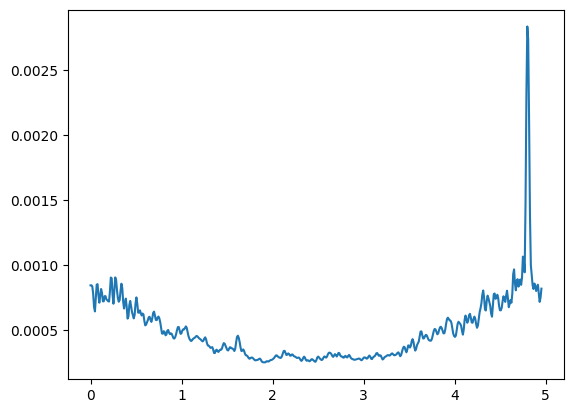

In [ ]:
# Range Profile
processed_data = data - np.mean(recording[0:5, :, :], axis=0)
range_profile = np.fft.ifft(processed_data, n=range_nfft, axis=2)

freq = config['freq']
Ts = 1/range_nfft/(freq[1]-freq[0]+1e-16) # Avoid nan checks
time_vec = np.linspace(0,Ts*(range_nfft-1),num=range_nfft)
dist_vec = time_vec*(c/2) # distance in meters

range_profile_norm = np.linalg.norm(range_profile, axis=1)
range_profile_norm[np.isnan(range_profile_norm)] = 0

plt.figure()
plt.plot(dist_vec,range_profile_norm[50,:])
plt.show()

# for profile in range_profile[50]:
#     plt.figure()
#     plt.plot(dist_vec, profile)
#     plt.show()

d 0.06606283962726593


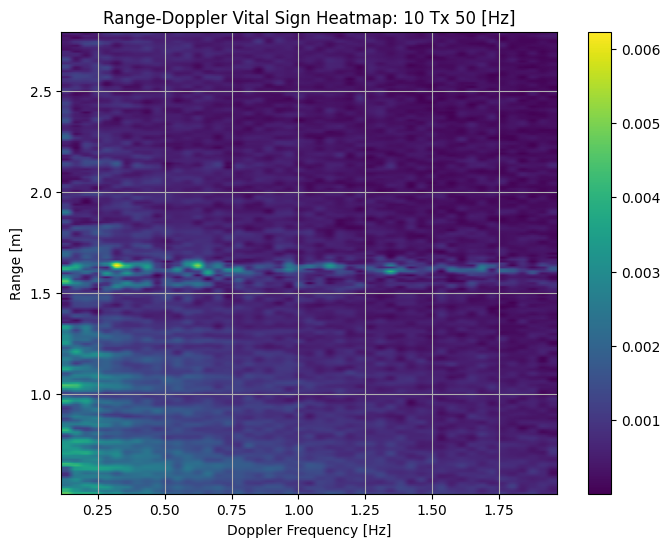

In [ ]:
# Range-Doppler Profile
doppler = np.fft.fft(np.real(range_profile_norm), n=doppler_nfft,  axis=0)
doppler = doppler[0:len(doppler)//2,:]
doppler = np.abs(doppler.T)

d = config["sample_time"]
pulse_repetition_frequency = 1/d
print("d", d)
doppler_freq = np.fft.fftfreq(doppler_nfft,d)
doppler_freq = doppler_freq[doppler_freq>=0]

plt.figure(figsize=(8,6))
freq_low = np.where(doppler_freq>=0.1)[0][0]
freq_high = np.where(doppler_freq<=2.0)[0][-1]
range_low = np.where(dist_vec>=0.5)[0][0]
range_high = np.where(dist_vec<=2.8)[0][-1]

extent=[doppler_freq[freq_low],doppler_freq[freq_high],dist_vec[range_low],dist_vec[range_high]]
plt.imshow((doppler[range_low:range_high, freq_low:freq_high]), origin='lower', extent=extent, aspect='auto')
# plt.legend()
plt.colorbar()
plt.xlabel("Doppler Frequency [Hz]")
plt.ylabel("Range [m]")
plt.title(f"Range-Doppler Vital Sign Heatmap: {num_tx} Tx {rbw} [Hz]")
plt.grid()
plt.show()

In [ ]:
processed_data_3d = processed_data.reshape(processed_data.shape[0], num_tx, 20, processed_data.shape[-1])
processed_data_3d_range = np.fft.fft2(processed_data_3d, s=angle_nfft, axes=(1, 2))
processed_data_3d_range = np.fft.ifft(processed_data_3d_range, n=range_nfft, axis=3)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


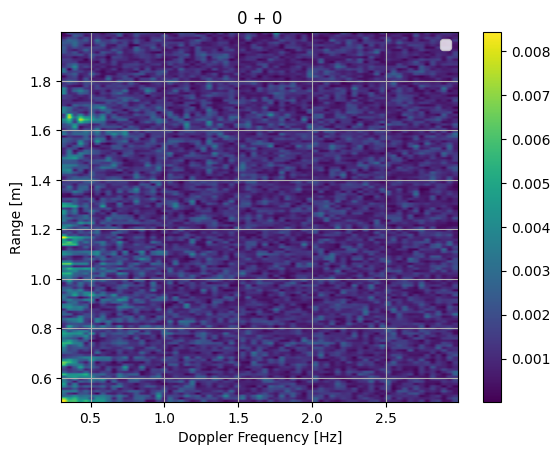

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


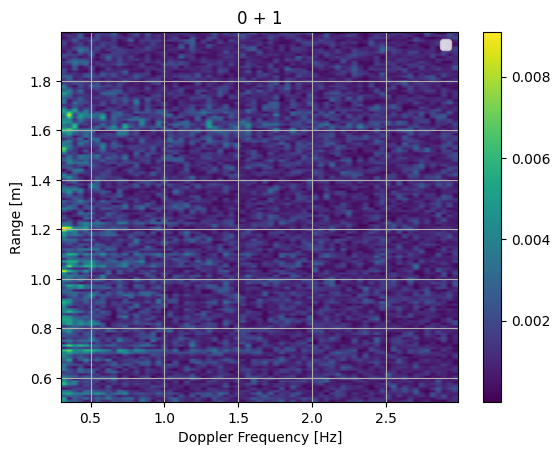

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


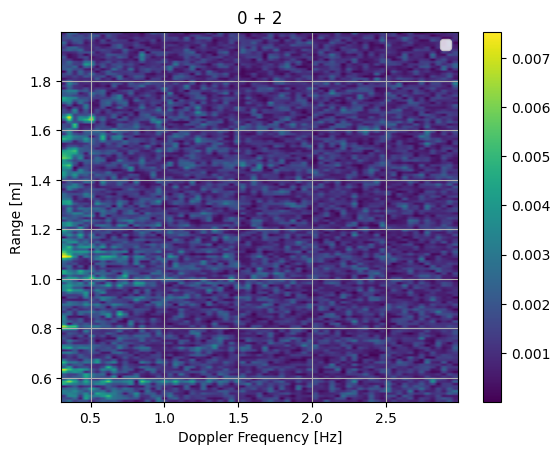

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


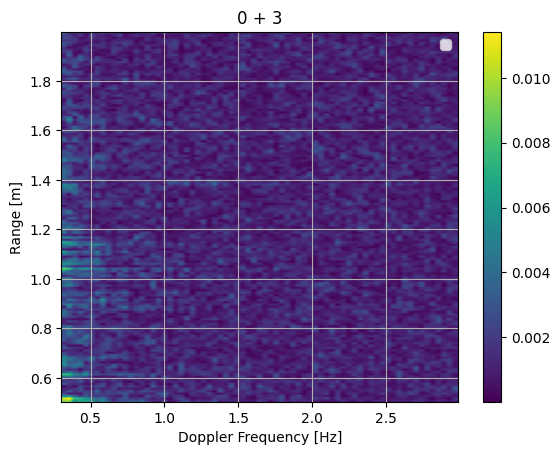

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


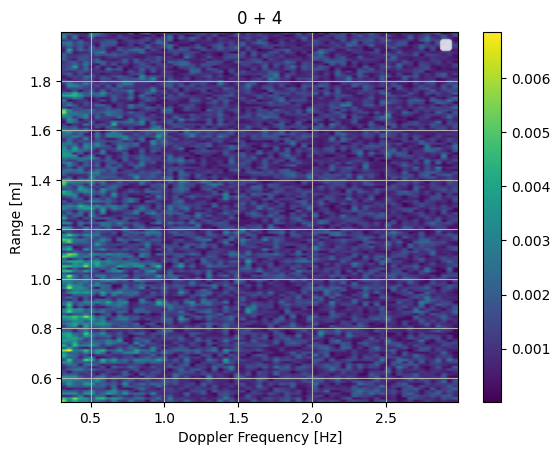

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


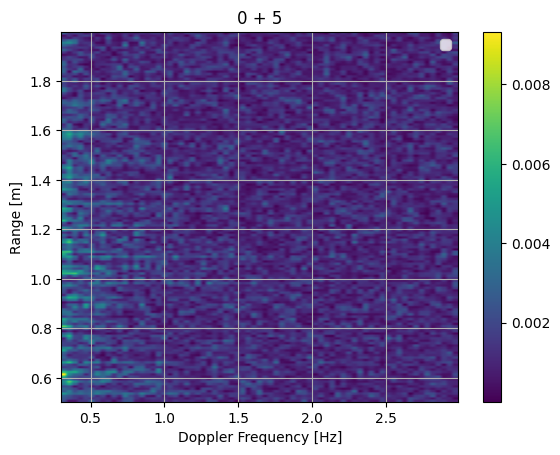

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


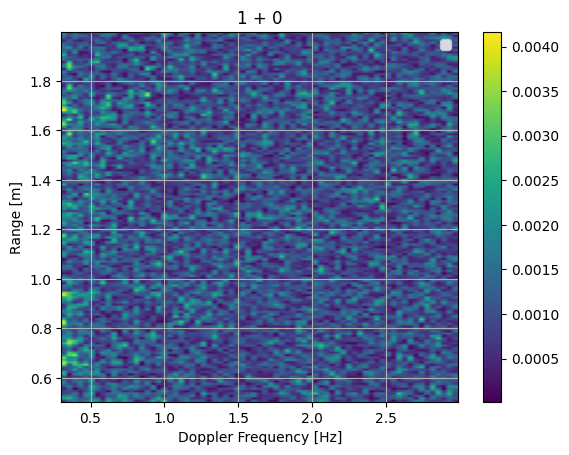

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


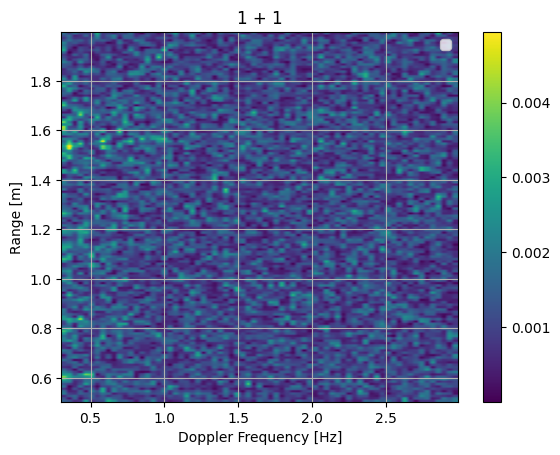

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


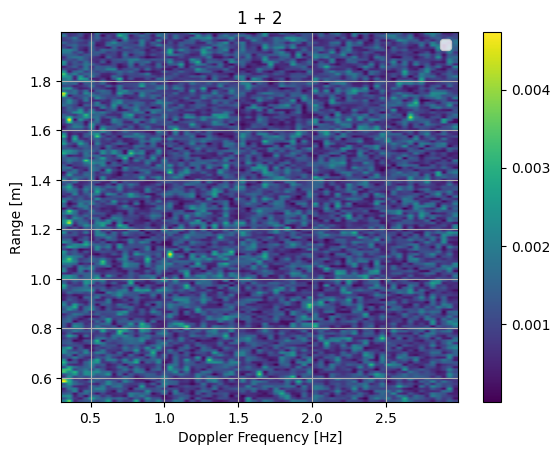

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


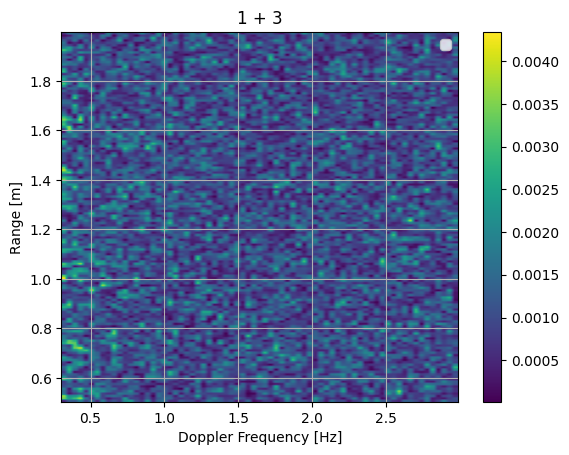

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


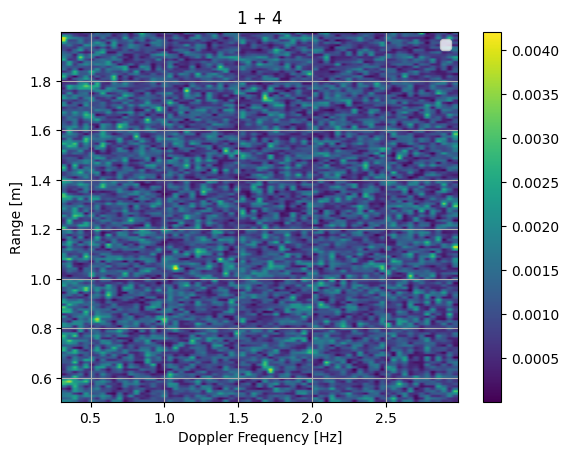

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


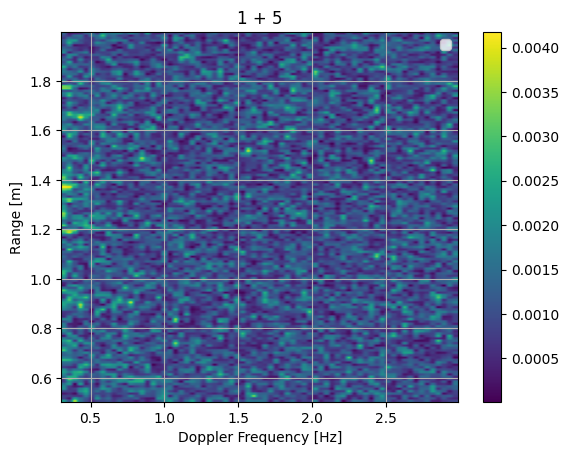

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


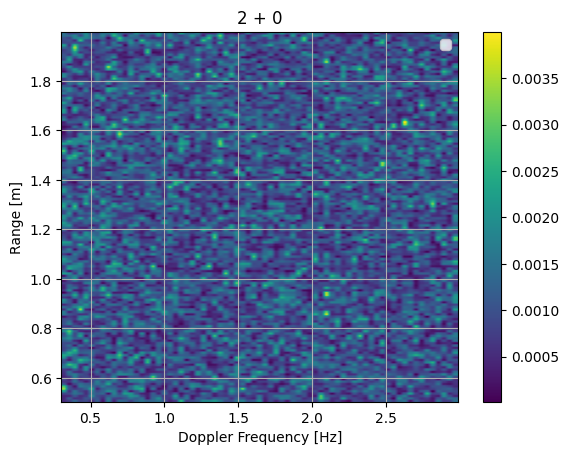

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


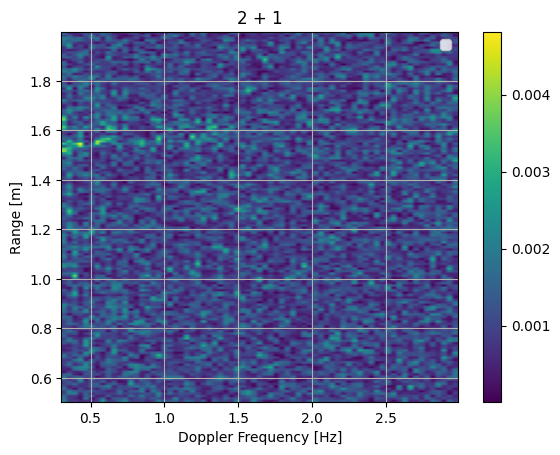

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


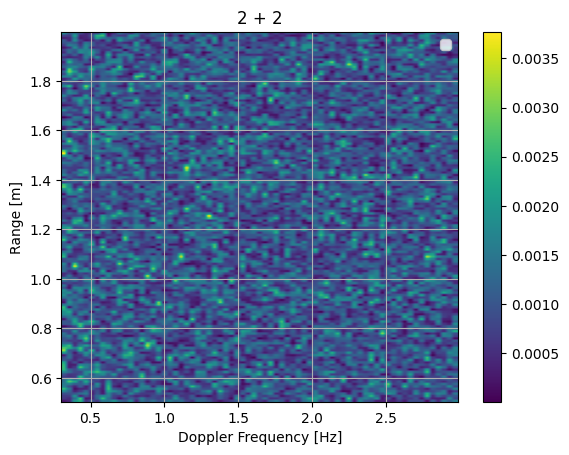

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


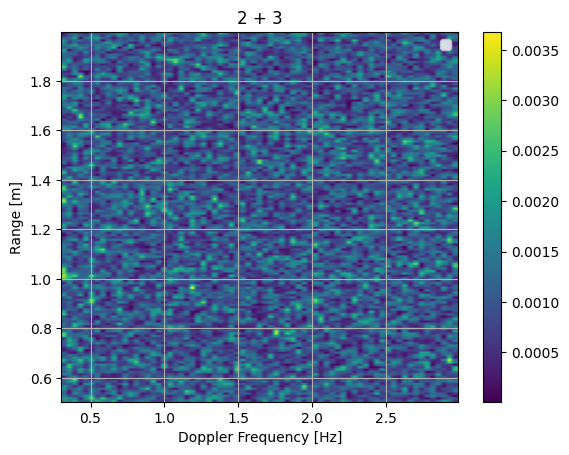

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


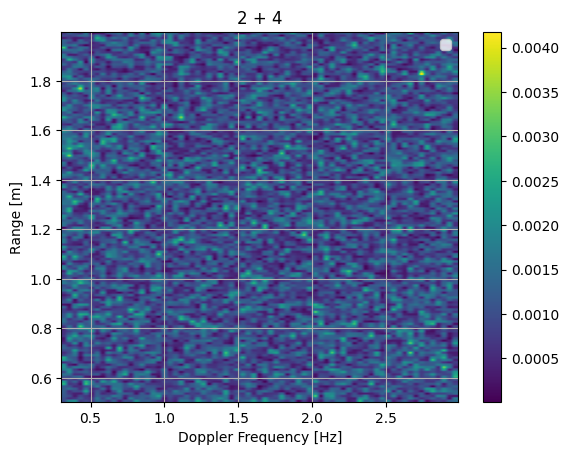

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


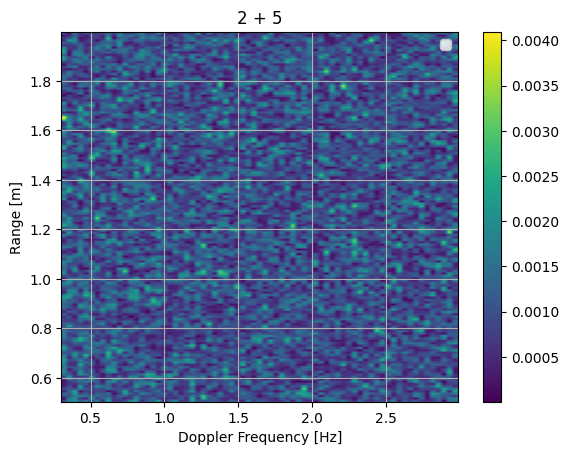

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


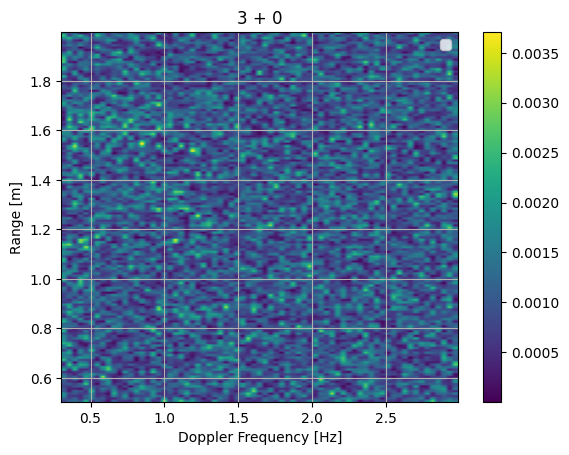

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


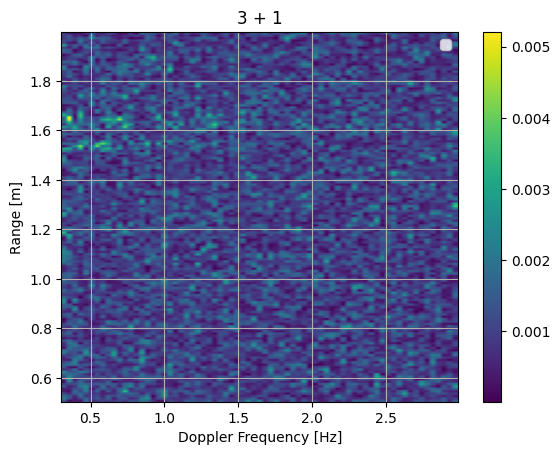

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


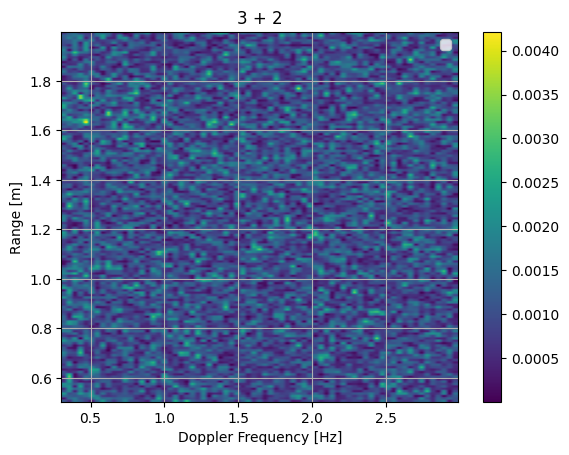

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


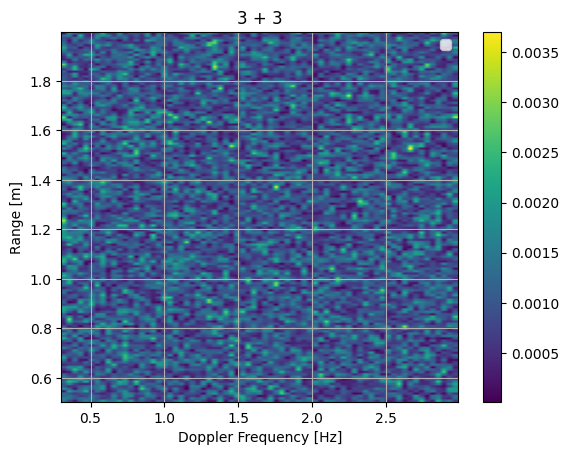

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


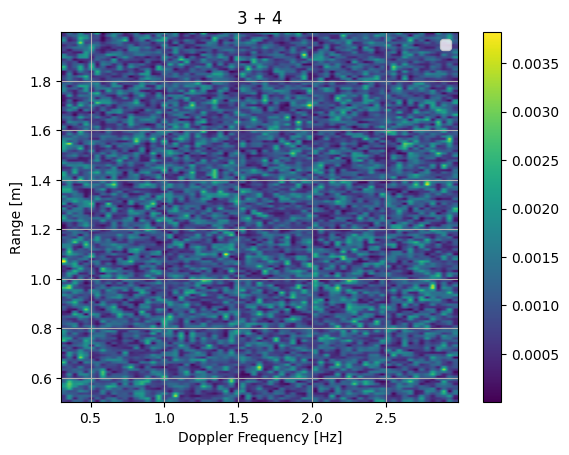

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


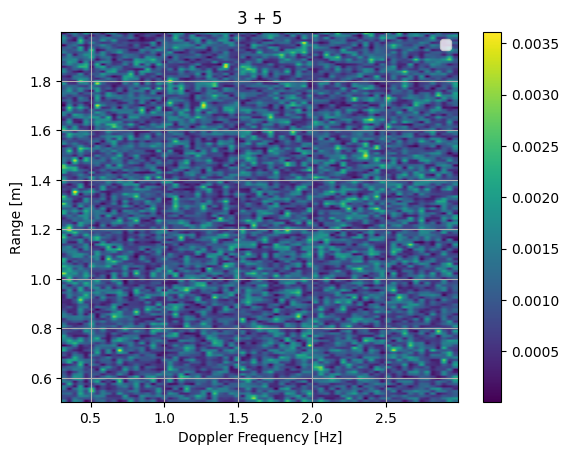

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


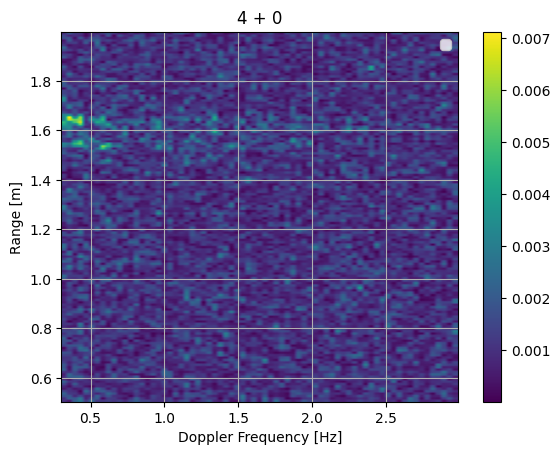

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


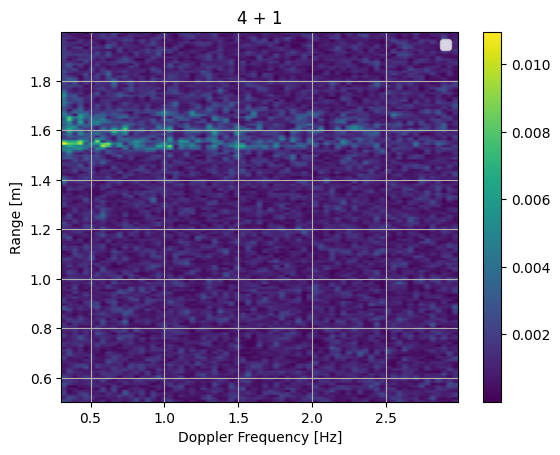

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


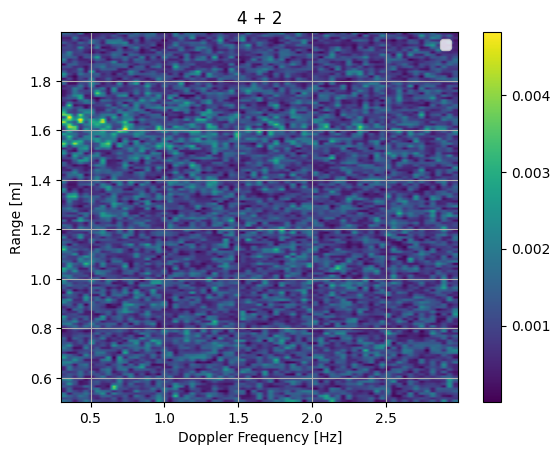

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


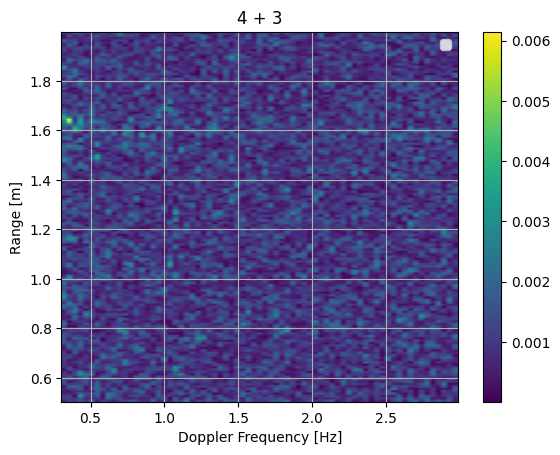

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


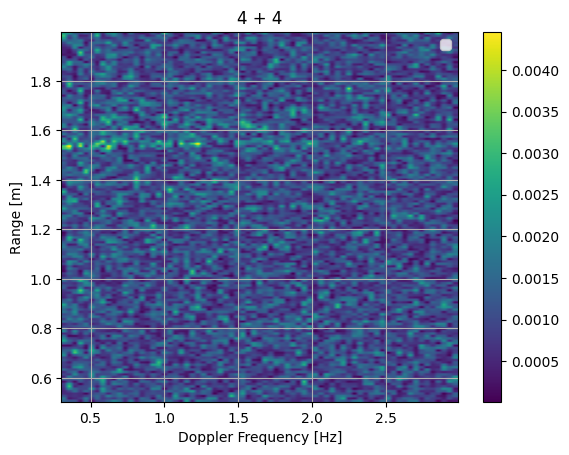

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


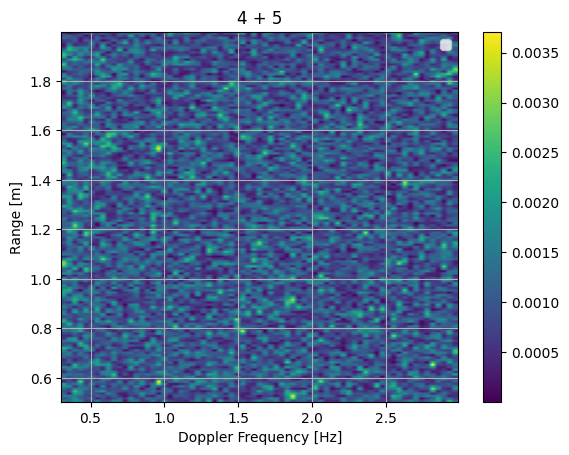

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


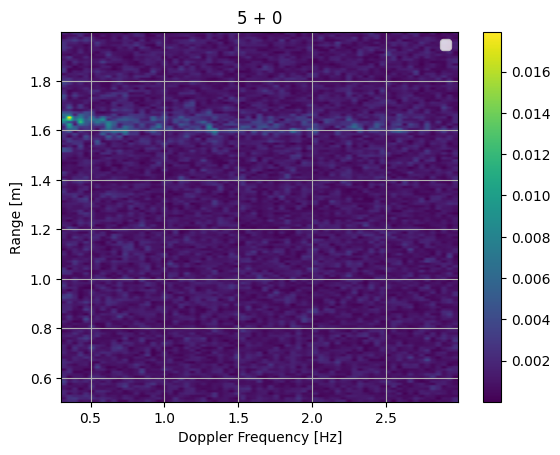

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


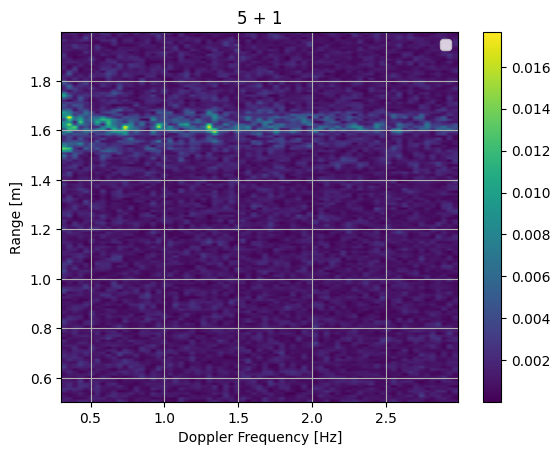

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


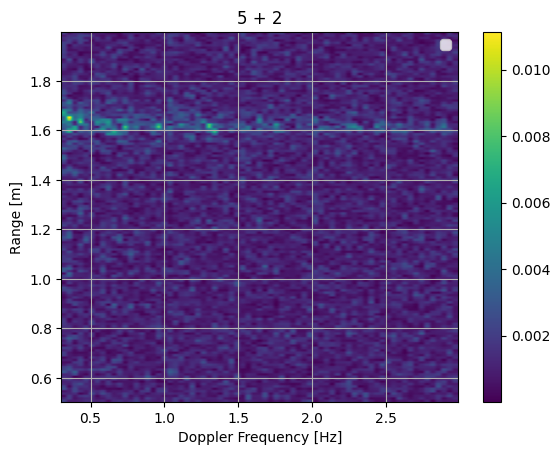

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


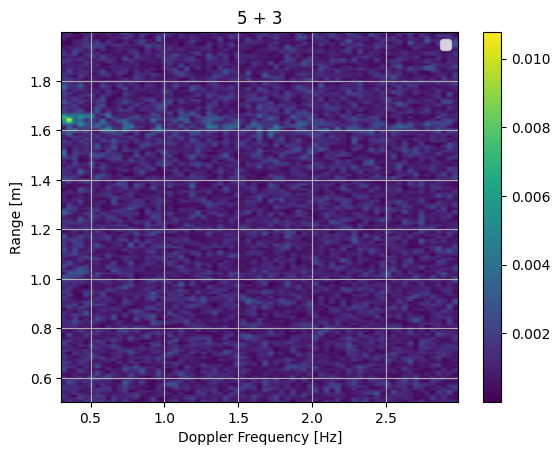

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


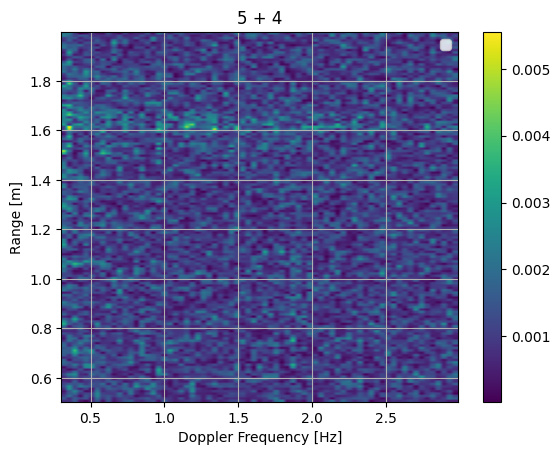

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


d 0.06606283962726593


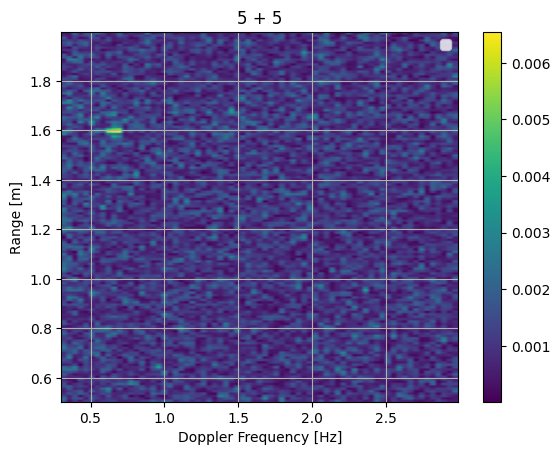

In [ ]:
for i in range(angle_nfft[0]):
    for j in range(angle_nfft[1]):
        value = processed_data_3d_range[:, i, j, :]
        doppler = np.fft.fft(np.real(value), n=doppler_nfft, axis=0)
        doppler_slide = doppler[0:len(doppler)//2,:]
        doppler_slide = np.abs(doppler_slide.T)

        freq = config['freq']
        Ts = 1/range_nfft/(freq[1]-freq[0]+1e-16) # Avoid nan checks
        time_vec = np.linspace(0,Ts*(range_nfft-1),num=range_nfft)
        dist_vec = time_vec*(c/2) # distance in meters

        d = config["sample_time"]
        pulse_repetition_frequency = 1/d
        print("d", d)
        doppler_freq = np.fft.fftfreq(doppler_nfft,d)
        doppler_freq = doppler_freq[doppler_freq>=0]

        # plt.figure(figsize=(8,6))
        freq_low = np.where(doppler_freq>=0.3)[0][0]
        freq_high = np.where(doppler_freq<=3)[0][-1]
        range_low = np.where(dist_vec>=0.5)[0][0]
        range_high = np.where(dist_vec<=2)[0][-1]

        extent=[doppler_freq[freq_low],doppler_freq[freq_high],dist_vec[range_low],dist_vec[range_high]]
        plt.imshow((doppler_slide[range_low:range_high, freq_low:freq_high]), origin='lower', extent=extent, aspect='auto')
        plt.legend()
        plt.colorbar()
        plt.xlabel("Doppler Frequency [Hz]")
        plt.ylabel("Range [m]")
        plt.title("{} + {}".format(i, j))
        plt.grid()
        plt.show()

In [ ]:
from vayyar_preprocessing import MVDR_beamforming

# MVDR Beamforming
# processed_data = data - np.mean(data[0:50, :, :])
# processed_data = processed_data[50:, :, :]
processed_data = data - np.mean(data[0:5, :, :], axis=0)
# processed_data = data
range_nfft = 128
range_profile = np.fft.ifft(processed_data, n=range_nfft, axis=2)
rangeAngle, bfWeight, invCovMat = MVDR_beamforming(range_profile, num_tx = 10, searchStep = 20)

/Users/mtang/Documents/BSENSE-in-cabin/DataProcessing/vayyar_preprocessing.py:70: ComplexWarning: Casting complex values to real discards the imaginary part
  invCovMat[rIdx, :, :] = pinv_covMat


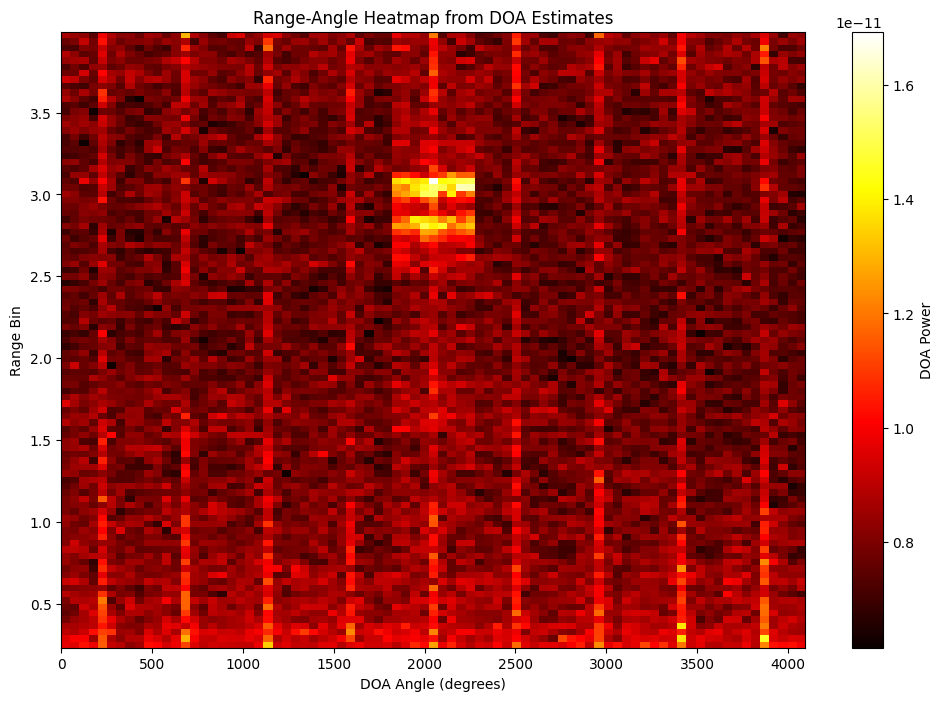

In [ ]:
import matplotlib.pyplot as plt

nRanges = range_nfft
# Assuming doa_estimates_matrix is the output from the adapted function
freq = config['freq']
Ts = 1/range_nfft/(freq[1]-freq[0]+1e-16) # Avoid nan checks
time_vec = np.linspace(0,Ts*(range_nfft-1),num=range_nfft)
dist_vec = time_vec*(c/2) # distance in meters
range_bins = dist_vec  # Your range bins
range_low = np.where(dist_vec>=0.2)[0][0]
range_high = np.where(dist_vec<=4)[0][-1]

doa_angles = np.linspace(0, 4096, 364)  # DOA angles
plt.figure(figsize=(12, 8))
plt.imshow(rangeAngle[range_low:range_high], aspect='auto', extent=[doa_angles[0], doa_angles[-1], range_bins[range_low], range_bins[range_high]], cmap='hot', origin='lower')
plt.colorbar(label='DOA Power')
plt.xlabel('DOA Angle (degrees)')
plt.ylabel('Range Bin')
plt.title('Range-Angle Heatmap from DOA Estimates')
plt.show()